In [1]:
#https://stackoverflow.com/questions/3474382/how-do-i-run-two-python-loops-concurrently

In [2]:
# https://towardsdatascience.com/real-time-eye-tracking-using-opencv-and-dlib-b504ca724ac6
# https://medium.com/@stepanfilonov/tracking-your-eyes-with-python-3952e66194a6

In [3]:
import cv2 # OpenCV
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from mtcnn.mtcnn import MTCNN
from PIL import Image
import dlib
import numpy as np
import time
from scipy.spatial import distance as dist
import mediapipe as mp
from skimage.color import rgb2hsv
import glob
from imutils import face_utils
import skimage.color
import skimage.io
import os, os.path

In [4]:
def haar(frame,rgb):
    # opencv object that will detect faces for us
    face_cascade = cv2.CascadeClassifier('./haarcascade_frontalface_alt.xml')


    front = face_cascade.detectMultiScale(
        rgb,
        scaleFactor=1.3,
        minNeighbors=5,
        minSize=(100, 100),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    
    pyplot.imshow(rgb)
    # get the context for drawing boxes
    
    ax = pyplot.gca()
    

    for (x, y, w, h) in front:
        # for each face on the image detected by OpenCV
        # draw a rectangle around the face
        cv2.rectangle(frame, 
                      (x, y), # start_point
                      (x+w, y+h), # end_point
                      (255, 0, 0),  # color in BGR
                      2) # thickness in px
        rect = Rectangle((x, y), w, h, fill=False, color='green', linewidth = 2)
        ax.add_patch(rect)

        print("Haar height is " + str(h))
        print("Haar width is " + str(w))
        cv2.rectangle(rgb,(x,y),(x+w,y+h),(0,255,0), 2)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame,'Haar Detection Completed',(x,y), font, 1, (0, 63, 123),2)
        
        print('Haar coordinate: width = ' + str(x) + 'to' + str(x+w))
        print('Haar coordinate: height = ' + str(y) + 'to'  + str(y+h))
      
        return(x,y,w,h)
        

In [5]:
# Defining function to draw HOG bounding box
def convert_and_trim_bb(image, rect):
    # extract the starting and ending (x, y)-coordinates of the
    # bounding box
    startX = rect.left()
    startY = rect.top()
    endX = rect.right()
    endY = rect.bottom()

    # ensure the bounding box coordinates fall within the spatial
    # dimensions of the image
    startX = max(0, startX)
    startY = max(0, startY)
    endX = min(endX, image.shape[1])
    endY = min(endY, image.shape[0])

    # compute the width and height of the bounding box
    w = endX - startX
    h = endY - startY

    # return our bounding box coordinates
    return (startX, startY, w, h)

In [6]:
def hog(frame,rgb):

    detector = dlib.get_frontal_face_detector()
    rects = detector(rgb)

    pyplot.imshow(rgb)
#     ax = pyplot.gca()

    boxes = [convert_and_trim_bb(rgb, r) for r in rects]
    
    
    
    for (x, y, w, h) in boxes:

        cv2.rectangle(frame, (x, y), (x + w, y + h), ( 255, 255, 255), 2)
        cv2.rectangle(rgb,(x,y),(x+w,y+h),(255,0,255), 2)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame,'HOG Detection Completed',(x,y), font, 1, (184,53,255),2)
        
        print("HOG height is " + str(h))
        print("HOG width is " + str(w))
        
        print('HOG coordinate: width = ' + str(x) + 'to' + str(x+w))
        print('HOG coordinate: height = ' + str(y) + 'to' + str(y + h))
      
            
        
        return(x,y,w,h)

In [7]:
def mtcnn(frame,rgb):
    detector = MTCNN()
    faces = detector.detect_faces(frame)

    pyplot.imshow(rgb)
    # get the context for drawing boxes
    ax = pyplot.gca()
    # plot each box
    for result in faces:
        # get coordinates
        x, y, width, height = result['box']
        # create the shape

        print("MTCNN height is " + str(height))
        print("MTCNN width is " + str(width))
        
        # draw the box
        
        cv2.rectangle(frame,(x,y),(x+width,y+height),(0,255,0),2)
        cv2.rectangle(rgb,(x,y),(x+width,y+height), (255,150,0), 2)

        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame,'MTCNN Detection Completed',(x,y), font, 1, (0,0,255),2)
            
        print('MTCNN coordinate: width = ' + str(x) + 'to' + str(x + width))
        print('MTCNN coordinate: height = ' + str(y) + 'to' + str(y + height))
        
        
        return(x,y,width,height)
    

In [8]:
def midpoint(ptA, ptB):
	return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

In [9]:
#Using Euclidean distance to find distance from center of eye to each side of bounding box
def top_head(rgb,detector,eye_centerX,eye_centerY):
    cv2.line(rgb, (int(eye_centerX), int(detector[1])), (int(eye_centerX), int(eye_centerY)),
                        (255,255,255), 2)
    D_top = dist.euclidean((eye_centerX, detector[1]), (eye_centerX, eye_centerY)) 
                    

    return(D_top)


def left_head(rgb,detector,eye_centerX,eye_centerY):
    cv2.line(rgb, (int(detector[0]+detector[2]), int(eye_centerY)), (int(eye_centerX), int(eye_centerY)),
                    (255,255,255), 2)
    D_left = dist.euclidean((detector[0]+detector[2], eye_centerY), (eye_centerX, eye_centerY))

    return(D_left)



def right_head(rgb,detector,eye_centerX,eye_centerY):
    
    cv2.line(rgb, (int(detector[0]), int(eye_centerY)), (int(eye_centerX), int(eye_centerY)),
                        (255,255,255), 2)
    D_right = dist.euclidean((detector[0], eye_centerY), (eye_centerX, eye_centerY)) 
    
    return(D_right)


def bot_head(rgb,detector,eye_centerX,eye_centerY):
    cv2.line(rgb, (int(eye_centerX), int(detector[1] + detector[3])), (int(eye_centerX), int(eye_centerY)),
                        (255,255,255), 2)
    D_bot = dist.euclidean((eye_centerX, detector[1] + detector[3]), (eye_centerX, eye_centerY)) 
    return(D_bot)
    

In [10]:
def eye(frame, rgb):
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor('./shape_predictor_68_face_landmarks.dat')

#     right = [36, 37, 38, 39, 40, 41]
#     left = [42, 43, 44, 45, 46, 47]
    kernel = np.ones((9, 9), np.uint8)
#     img = cv2.imread(filename)
#     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = frame.copy()
    rects = detector(rgb, 1)
    for rect in rects:
        
            
        shape = predictor(frame, rect)
        shape = face_utils.shape_to_np(shape)

        
        #Finding the coordinates of the center of left eye
        mid_left_x = (shape[43][0]+(shape[46][0]))/2
        mid_left_y = (shape[43][1]+(shape[46][1]))/2
        eye_left_cord = mid_left_x, mid_left_y
        cv2.line(rgb, (int(mid_left_x), int(mid_left_y)), (int(mid_left_x), int(mid_left_y)), (255, 0, 0), 10)
        cv2.line(frame, (int(mid_left_x), int(mid_left_y)), (int(mid_left_x), int(mid_left_y)), (0, 0, 255), 10)
    
        #Finding the coordinates of the center of right eye
        mid_right_x = (shape[37][0]+(shape[40][0]))/2
        mid_right_y = (shape[37][1]+(shape[40][1]))/2
        eye_right_cord = mid_right_x, mid_right_y
        cv2.line(rgb, (int(mid_right_x), int(mid_right_y)), (int(mid_right_x), int(mid_right_y)), (255, 0, 0), 10)
        cv2.line(frame, (int(mid_right_x), int(mid_right_y)), (int(mid_right_x), int(mid_right_y)), (0, 0, 255), 10)
        

        return mid_left_x, mid_left_y, eye_left_cord, mid_right_x, mid_right_y, eye_right_cord
            
    plt.figure(1)
    plt.imshow(rgb)



In [11]:
#Cropping the features according to assigned points
def crop(mesh_coor, indices,rgb):
    mask = np.zeros(rgb.shape[:2],np.uint8)
    pts = np.array([[mesh_coor[p] for p in indices]] )

    cv2.fillPoly(mask,pts,(255))

    dst = cv2.bitwise_and(rgb,rgb,mask=mask)

    rect = cv2.boundingRect(pts)
    x,y,w,h = rect
    
    
    try:
        roi = rgb[y:y+h,x:x+w]
#         plt.figure()
#         plt.imshow(roi)

    except:
        print("Cropped feature too small")

    try:
        cropped = dst[y:y+h,x:x+w]
        plt.figure()
        plt.imshow(cropped)

    except:
        print("Cropped feature too small")
       
    gray = cv2.cvtColor(cropped,cv2.COLOR_RGB2GRAY)
    mask_g = cv2.threshold(gray,250,255,cv2.THRESH_BINARY)[1]

    mask_g = 255 - mask_g

     #Remove noise
    kernel = np.ones((3,3),np.uint8)
    mask = cv2.morphologyEx(mask_g,cv2.MORPH_OPEN,kernel)
    mask = cv2.morphologyEx(mask_g,cv2.MORPH_OPEN,kernel)

    result = cropped.copy()
    result = cv2.cvtColor(result,cv2.COLOR_RGB2RGBA)
    result[:,:,3] = mask

    return result, result.shape, roi



In [12]:
def face_mesh(face):
    NUM_FACE = 2
    mpDraw = mp.solutions.drawing_utils
    mpFaceMesh = mp.solutions.face_mesh
    faceMesh = mpFaceMesh.FaceMesh(max_num_faces = NUM_FACE)
    drawSpec = mpDraw.DrawingSpec(thickness = 1, circle_radius = 1, color = (0,250,250))
    
    #Commented points are just in case some parts of face(s) get cut / not all points in mesh gets detected 
    RIGHT_CHEEK = [233,232,231,230,229,228, 31,226,35,143,34,127,227,137,177,215,58,172,136,210,202,43,92,203,142,126,217,114,128]
#     RIGHT_CHEEK = [233,232,231,230,229,228, 31,111,116,123,147,213,192,210,202,43,92,203,142,126,217,114,128]
    LEFT_CHEEK = [452, 451, 450, 449,448,261,265,372,447,366,401,435,367,364, 430,422,371,277,350]
#     LEFT_CHEEK = [452, 451, 450, 449,448,261,265,372,345,352,376,416,430,422,371,277,350]
    CHIN = [43,106,182,83,18,313,406,335,273,422, 430, 394, 379,378,400,377,152,148,176,149,150,169,210,202]
#     CHIN = [43,106,182,83,18,313,406,335,273,422, 430, 394, 379,378,369,428,199,208,140,149,150,169,210,202]
    FOREHEAD = [21,54,103,67,109,10,338,297,332,284,251,368,383,300,293,334,296,336,285,417,168,193,55,107,66,105,63,70,71]
    # RIGHT_EYE=[ 33, 7, 163, 144, 145, 153, 154, 155, 133, 173, 157, 158, 159, 160, 161 , 246 ]  

    

    rgb = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
    clone = rgb.copy()
    results = faceMesh.process(face)
    
    if results.multi_face_landmarks:
        for faceLms in results.multi_face_landmarks:
            mpDraw.draw_landmarks(clone,faceLms,mpFaceMesh.FACEMESH_TESSELATION,drawSpec,drawSpec)

            plt.figure()
            plt.imshow(clone)
            plt.grid(False)


    img_height, img_width,ic = rgb.shape

    
    try:
        mesh_coord = [(int(point.x * img_width), int(point.y * img_height)) for point in results.multi_face_landmarks[0].landmark]


        cv2.polylines(rgb,  [np.array([mesh_coord[p] for p in LEFT_CHEEK ], dtype=np.int32)], True,(0,255,0), 2, cv2.LINE_AA)
        cv2.polylines(rgb,  [np.array([mesh_coord[p] for p in RIGHT_CHEEK ], dtype=np.int32)], True,(0,255,0), 2, cv2.LINE_AA)
        cv2.polylines(rgb,  [np.array([mesh_coord[p] for p in CHIN ], dtype=np.int32)], True, (0,0,255), 2, cv2.LINE_AA)
        cv2.polylines(rgb,  [np.array([mesh_coord[p] for p in FOREHEAD ], dtype=np.int32)], True, (255,0,0), 2, cv2.LINE_AA)

        plt.figure(4)
        plt.imshow(rgb)



#       Crop features
        Lcheek = crop(mesh_coord,LEFT_CHEEK,rgb)
        print("Left cheek dimension: " + str(Lcheek[1]))
        area_l = Lcheek[1][0] * Lcheek[1][1]
        print("Area of left cheek: " + str(area_l))
        
        Rcheek = crop(mesh_coord,RIGHT_CHEEK,rgb)
        print("\nRight cheek dimension: " + str(Rcheek[1]))
        area_r = Rcheek[1][0] * Rcheek[1][1]
        print("Area of right cheek: " + str(area_r))
        
        forehead = crop(mesh_coord,FOREHEAD,rgb)
        print("\nForehead dimension: " + str(forehead[1]))
        area_f = forehead[1][0] * forehead[1][1]
        print("Area of forehead: " + str(area_f))
        
        Chin = crop(mesh_coord,CHIN,rgb)
        print("\nChin dimension: " + str(Chin[1]))
        area_c = Chin[1][0] * Chin[1][1]
        print("Area of chin: " + str(area_c))
        
        print("=========================")
        
        return Lcheek, Rcheek, forehead, Chin, area_l, area_r, area_f, area_c


    except:
        print("Cropped image too small")
        print("=======================")    

Image #1: 8_1_4_20170103200419199.jpg
MTCNN height is 578
MTCNN width is 439
MTCNN coordinate: width = 92to531
MTCNN coordinate: height = 104to682
HOG height is 446
HOG width is 446
HOG coordinate: width = 88to534
HOG coordinate: height = 237to683
Haar height is 466
Haar width is 466
Haar coordinate: width = 70to536
Haar coordinate: height = 182to648

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 265.0
Distance of right eye to right side of head (MTCNN with blue text): 107.5
Distance of left eye to left side of head (MTCNN with blue text): 123.0
Distance of left eye to bottom of head (MTCNN with blue text): 313.0

Distance of left eye to top of head (HOG with yellow text):132.0
Distance of right eye to right side of head (HOG with yellow text): 111.5
Distance of left eye to left side of head (HOG with yellow text): 126.0
Distance of left eye to bottom of head (HOG with yellow text): 314.0

Distance of left eye to top of head (Haar 

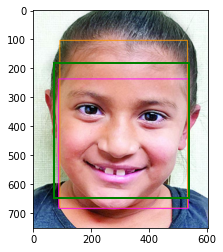

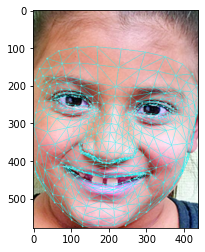

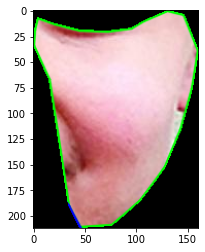

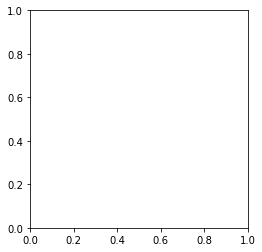

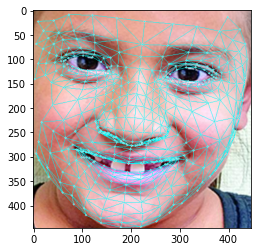

...

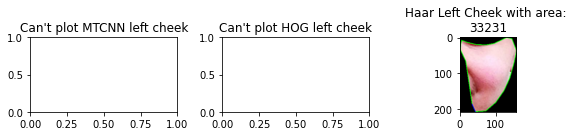

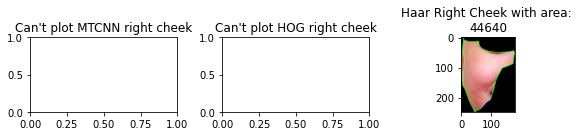

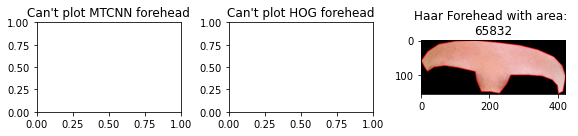

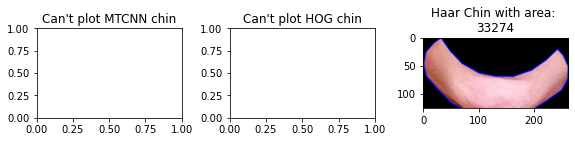

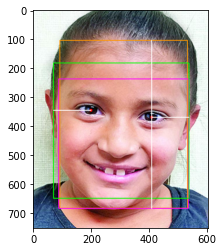

Image #2: 8_1_4_20170104010936352.jpg
MTCNN height is 184
MTCNN width is 146
MTCNN coordinate: width = 163to309
MTCNN coordinate: height = 65to249
HOG height is 149
HOG width is 149
HOG coordinate: width = 178to327
HOG coordinate: height = 95to244
Haar height is 173
Haar width is 173
Haar coordinate: width = 163to336
Haar coordinate: height = 72to245

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 77.0
Distance of right eye to right side of head (MTCNN with blue text): 51.0
Distance of left eye to left side of head (MTCNN with blue text): 26.5
Distance of left eye to bottom of head (MTCNN with blue text): 107.0

Distance of left eye to top of head (HOG with yellow text):47.0
Distance of right eye to right side of head (HOG with yellow text): 36.0
Distance of left eye to left side of head (HOG with yellow text): 44.5
Distance of left eye to bottom of head (HOG with yellow text): 102.0

Distance of left eye to top of head (Haar with p

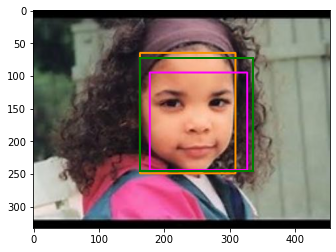

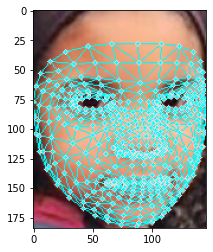

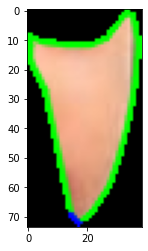

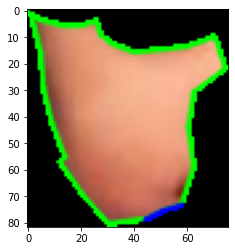

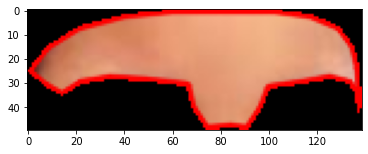

...

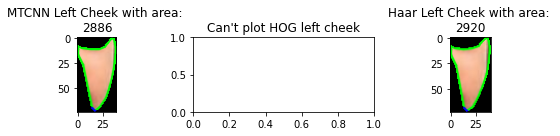

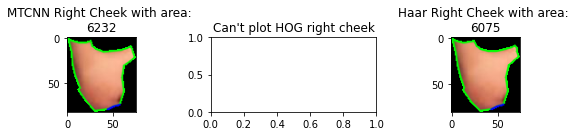

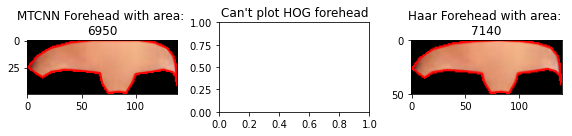

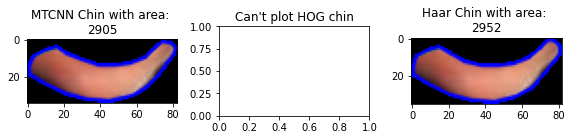

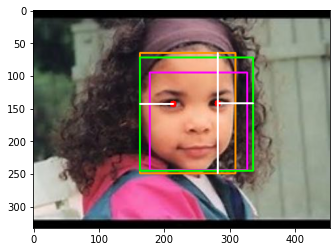

Image #3: 8_1_4_20170109202358152.jpg
MTCNN height is 567
MTCNN width is 472
MTCNN coordinate: width = 709to1181
MTCNN coordinate: height = 435to1002
HOG height is 446
HOG width is 446
HOG coordinate: width = 732to1178
HOG coordinate: height = 534to980
Haar height is 566
Haar width is 566
Haar coordinate: width = 666to1232
Haar coordinate: height = 424to990

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 208.5
Distance of right eye to right side of head (MTCNN with blue text): 136.0
Distance of left eye to left side of head (MTCNN with blue text): 109.0
Distance of left eye to bottom of head (MTCNN with blue text): 358.5

Distance of left eye to top of head (HOG with yellow text):109.5
Distance of right eye to right side of head (HOG with yellow text): 113.0
Distance of left eye to left side of head (HOG with yellow text): 106.0
Distance of left eye to bottom of head (HOG with yellow text): 336.5

Distance of left eye to top of head

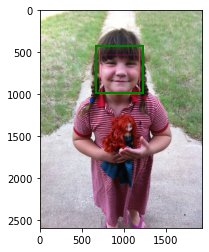

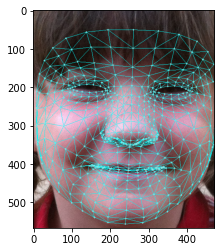

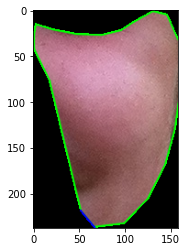

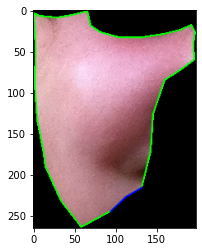

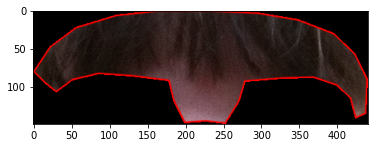

...

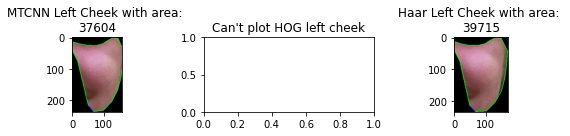

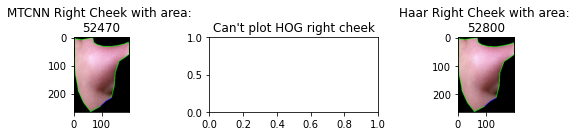

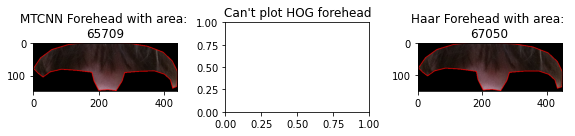

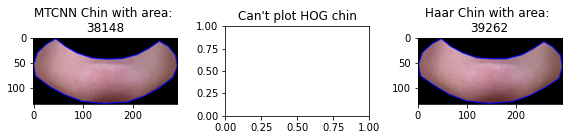

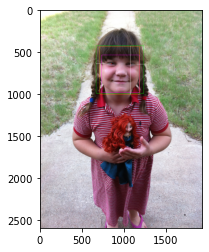

Image #4: 8_1_4_20161221202611945.jpg
MTCNN height is 269
MTCNN width is 207
MTCNN coordinate: width = 126to333
MTCNN coordinate: height = 67to336
HOG height is 215
HOG width is 215
HOG coordinate: width = 113to328
HOG coordinate: height = 113to328
Haar height is 248
Haar width is 248
Haar coordinate: width = 104to352
Haar coordinate: height = 79to327

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 105.0
Distance of right eye to right side of head (MTCNN with blue text): 50.0
Distance of left eye to left side of head (MTCNN with blue text): 56.5
Distance of left eye to bottom of head (MTCNN with blue text): 164.0

Distance of left eye to top of head (HOG with yellow text):59.0
Distance of right eye to right side of head (HOG with yellow text): 63.0
Distance of left eye to left side of head (HOG with yellow text): 51.5
Distance of left eye to bottom of head (HOG with yellow text): 156.0

Distance of left eye to top of head (Haar with

/Users/lalida/anaconda3/envs/test/lib/python3.7/site-packages/ipykernel_launcher.py:607: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


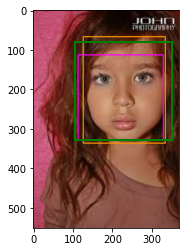

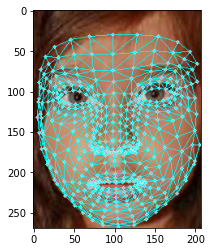

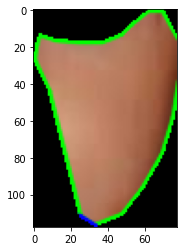

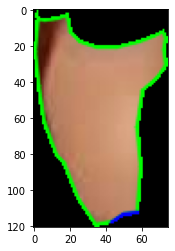

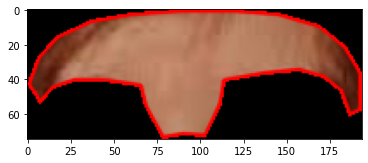

...

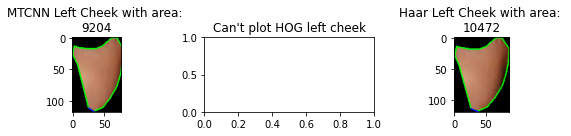

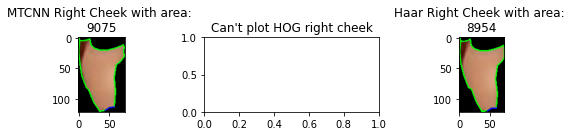

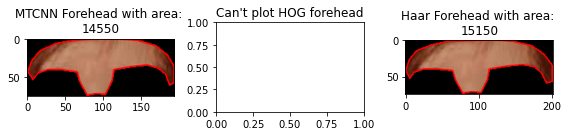

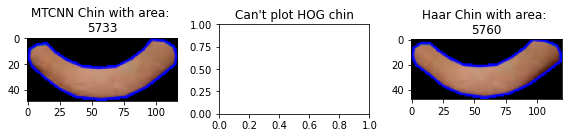

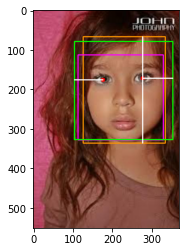

Image #5: 8_1_4_20161223230045701.jpg
MTCNN height is 120
MTCNN width is 92
MTCNN coordinate: width = 220to312
MTCNN coordinate: height = 24to144
HOG height is 104
HOG width is 103
HOG coordinate: width = 227to330
HOG coordinate: height = 42to146
No 3 face detection


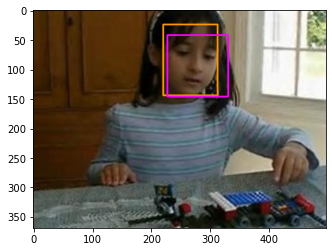

Image #6: 8_1_4_20161223230041764.jpg
MTCNN height is 59
MTCNN width is 45
MTCNN coordinate: width = 92to137
MTCNN coordinate: height = 49to108
No 3 face detection


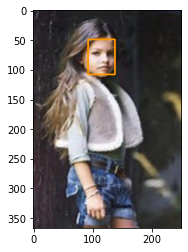

Image #7: 8_1_4_20170103210016155.jpg
MTCNN height is 198
MTCNN width is 156
MTCNN coordinate: width = 180to336
MTCNN coordinate: height = 49to247
HOG height is 149
HOG width is 150
HOG coordinate: width = 194to344
HOG coordinate: height = 95to244
Haar height is 192
Haar width is 192
Haar coordinate: width = 170to362
Haar coordinate: height = 58to250

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 88.0
Distance of right eye to right side of head (MTCNN with blue text): 54.5
Distance of left eye to left side of head (MTCNN with blue text): 31.5
Distance of left eye to bottom of head (MTCNN with blue text): 110.0

Distance of left eye to top of head (HOG with yellow text):42.0
Distance of right eye to right side of head (HOG with yellow text): 40.5
Distance of left eye to left side of head (HOG with yellow text): 39.5
Distance of left eye to bottom of head (HOG with yellow text): 107.0

Distance of left eye to top of head (Haar with p

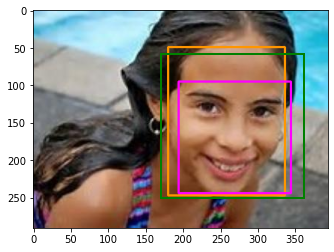

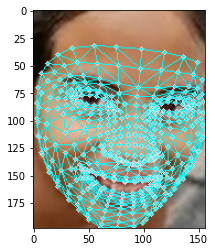

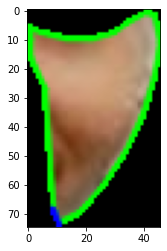

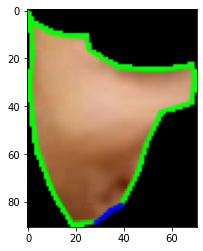

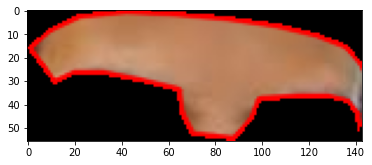

...

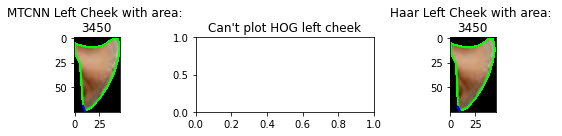

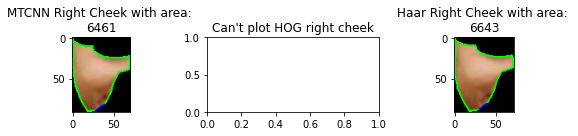

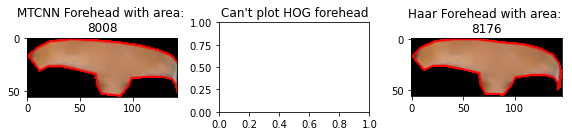

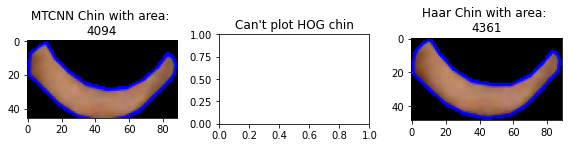

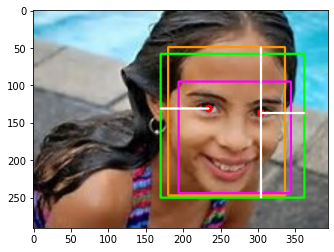

Image #8: 8_1_4_20170109202753127.jpg
MTCNN height is 52
MTCNN width is 42
MTCNN coordinate: width = 126to168
MTCNN coordinate: height = 23to75
No 3 face detection


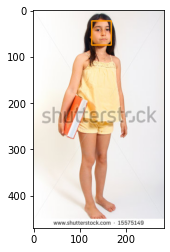

Image #9: 8_1_4_20170104005525759.jpg
MTCNN height is 169
MTCNN width is 131
MTCNN coordinate: width = 213to344
MTCNN coordinate: height = 82to251
HOG height is 125
HOG width is 125
HOG coordinate: width = 217to342
HOG coordinate: height = 120to245
Haar height is 160
Haar width is 160
Haar coordinate: width = 203to363
Haar coordinate: height = 86to246

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 67.0
Distance of right eye to right side of head (MTCNN with blue text): 39.5
Distance of left eye to left side of head (MTCNN with blue text): 31.5
Distance of left eye to bottom of head (MTCNN with blue text): 102.0

Distance of left eye to top of head (HOG with yellow text):29.0
Distance of right eye to right side of head (HOG with yellow text): 35.5
Distance of left eye to left side of head (HOG with yellow text): 29.5
Distance of left eye to bottom of head (HOG with yellow text): 96.0

Distance of left eye to top of head (Haar with p

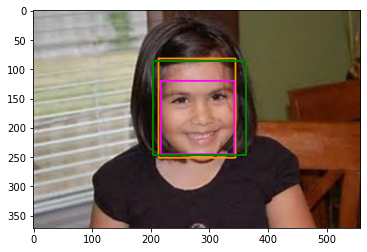

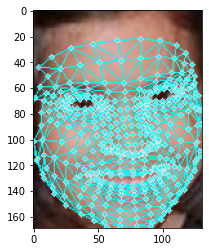

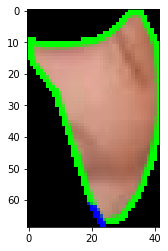

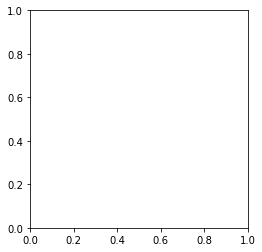

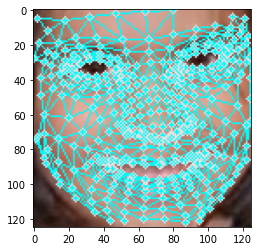

...

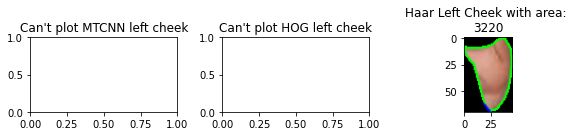

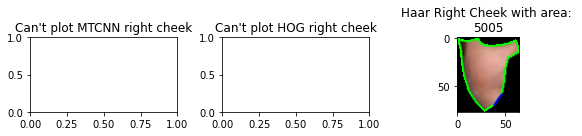

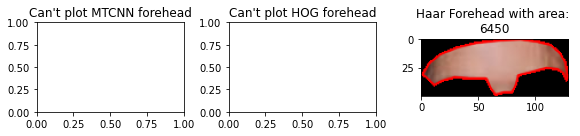

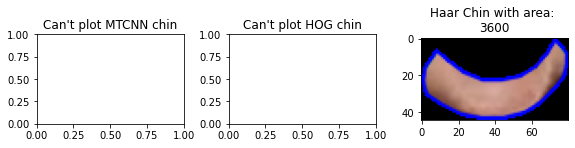

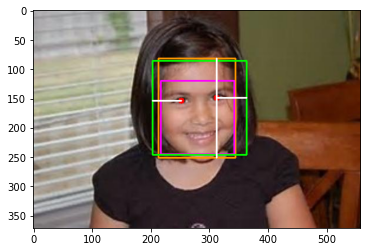

Image #10: 8_1_4_20170109201742209.jpg
MTCNN height is 572
MTCNN width is 448
MTCNN coordinate: width = 213to661
MTCNN coordinate: height = 381to953
HOG height is 445
HOG width is 446
HOG coordinate: width = 187to633
HOG coordinate: height = 485to930
Haar height is 554
Haar width is 554
Haar coordinate: width = 117to671
Haar coordinate: height = 404to958

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 229.5
Distance of right eye to right side of head (MTCNN with blue text): 78.0
Distance of left eye to left side of head (MTCNN with blue text): 179.5
Distance of left eye to bottom of head (MTCNN with blue text): 342.5

Distance of left eye to top of head (HOG with yellow text):125.5
Distance of right eye to right side of head (HOG with yellow text): 104.0
Distance of left eye to left side of head (HOG with yellow text): 151.5
Distance of left eye to bottom of head (HOG with yellow text): 319.5

Distance of left eye to top of head (Ha

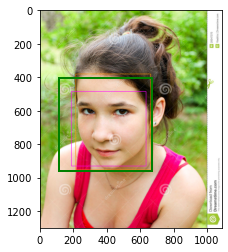

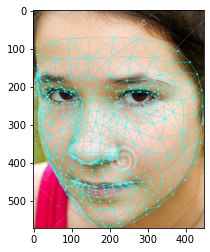

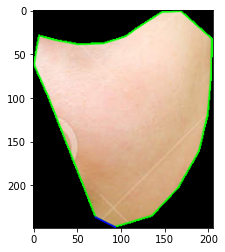

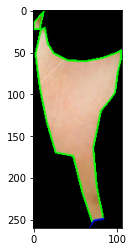

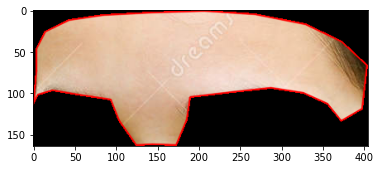

...

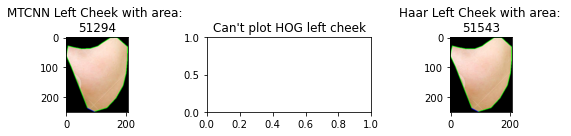

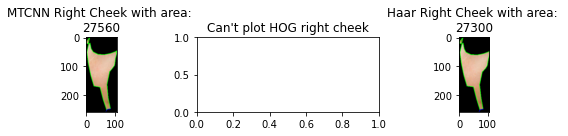

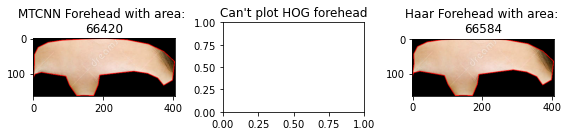

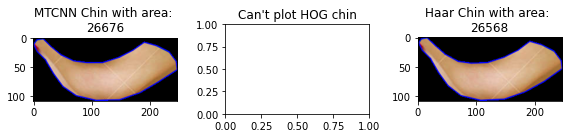

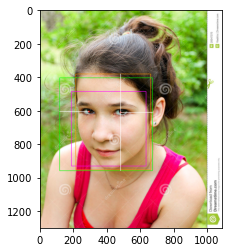

Image #11: 8_1_4_20170103214220325.jpg
MTCNN height is 164
MTCNN width is 138
MTCNN coordinate: width = 60to198
MTCNN coordinate: height = 73to237
HOG height is 124
HOG width is 124
HOG coordinate: width = 79to203
HOG coordinate: height = 107to231
Haar height is 168
Haar width is 168
Haar coordinate: width = 44to212
Haar coordinate: height = 76to244

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 59.5
Distance of right eye to right side of head (MTCNN with blue text): 38.0
Distance of left eye to left side of head (MTCNN with blue text): 41.0
Distance of left eye to bottom of head (MTCNN with blue text): 104.5

Distance of left eye to top of head (HOG with yellow text):25.5
Distance of right eye to right side of head (HOG with yellow text): 19.0
Distance of left eye to left side of head (HOG with yellow text): 46.0
Distance of left eye to bottom of head (HOG with yellow text): 98.5

Distance of left eye to top of head (Haar with pin

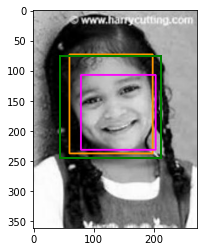

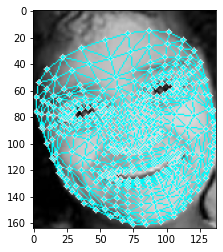

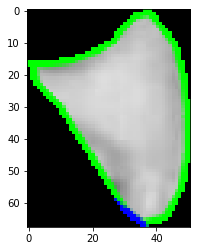

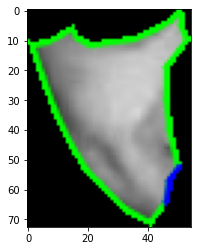

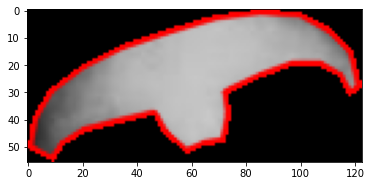

...

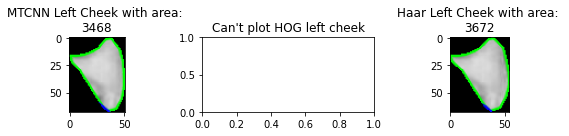

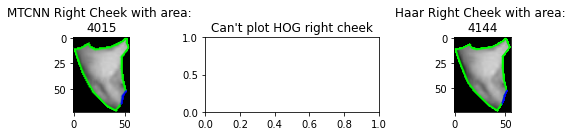

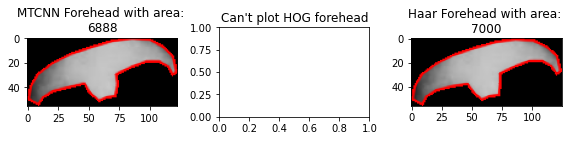

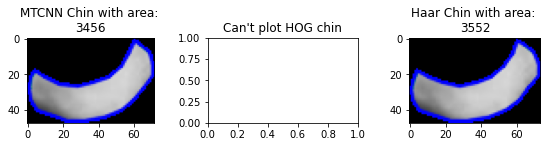

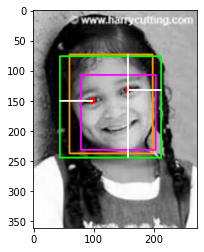

Image #12: 8_1_4_20170109202334991.jpg
MTCNN height is 122
MTCNN width is 97
MTCNN coordinate: width = 333to430
MTCNN coordinate: height = 65to187
HOG height is 103
HOG width is 104
HOG coordinate: width = 319to423
HOG coordinate: height = 89to192
Haar height is 139
Haar width is 139
Haar coordinate: width = 316to455
Haar coordinate: height = 62to201

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 58.0
Distance of right eye to right side of head (MTCNN with blue text): 30.0
Distance of left eye to left side of head (MTCNN with blue text): 21.5
Distance of left eye to bottom of head (MTCNN with blue text): 64.0

Distance of left eye to top of head (HOG with yellow text):34.0
Distance of right eye to right side of head (HOG with yellow text): 44.0
Distance of left eye to left side of head (HOG with yellow text): 14.5
Distance of left eye to bottom of head (HOG with yellow text): 69.0

Distance of left eye to top of head (Haar with pin

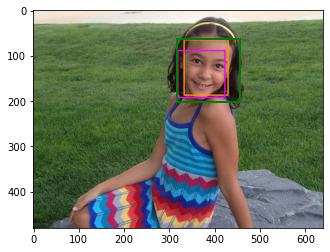

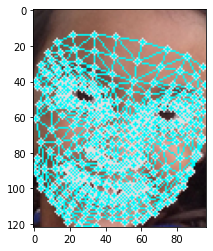

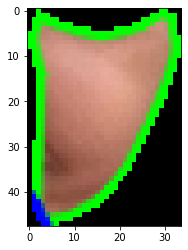

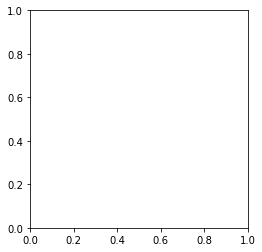

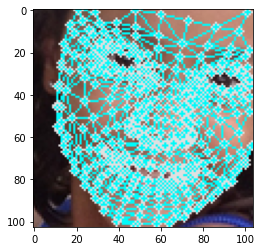

...

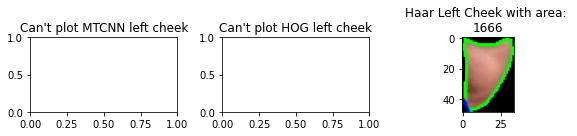

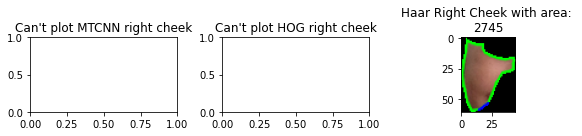

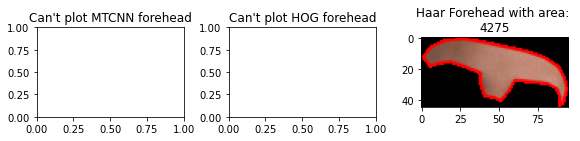

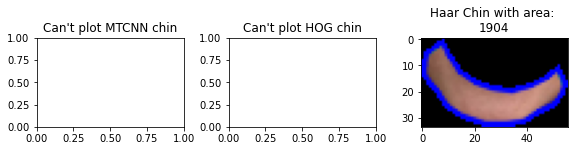

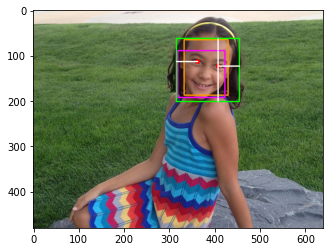

Image #13: 8_1_4_20170104005228631.jpg
MTCNN height is 312
MTCNN width is 256
MTCNN coordinate: width = 164to420
MTCNN coordinate: height = 2to314
HOG height is 303
HOG width is 310
HOG coordinate: width = 164to474
HOG coordinate: height = 26to329
No 3 face detection


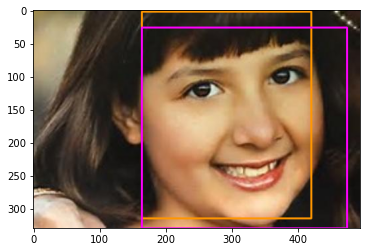

Image #14: 8_1_4_20170104005426863.jpg
MTCNN height is 199
MTCNN width is 162
MTCNN coordinate: width = 129to291
MTCNN coordinate: height = 41to240
HOG height is 180
HOG width is 179
HOG coordinate: width = 114to293
HOG coordinate: height = 74to254
Haar height is 212
Haar width is 212
Haar coordinate: width = 98to310
Haar coordinate: height = 42to254

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 91.0
Distance of right eye to right side of head (MTCNN with blue text): 39.0
Distance of left eye to left side of head (MTCNN with blue text): 43.5
Distance of left eye to bottom of head (MTCNN with blue text): 108.0

Distance of left eye to top of head (HOG with yellow text):58.0
Distance of right eye to right side of head (HOG with yellow text): 54.0
Distance of left eye to left side of head (HOG with yellow text): 45.5
Distance of left eye to bottom of head (HOG with yellow text): 122.0

Distance of left eye to top of head (Haar with p

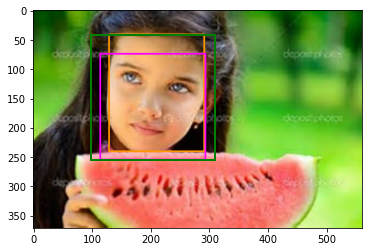

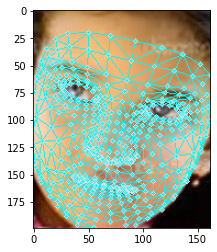

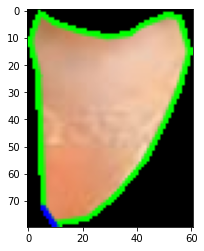

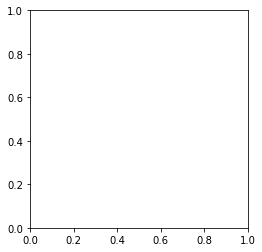

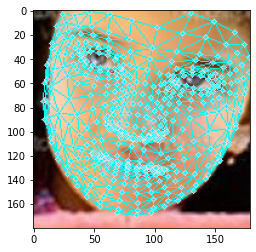

...

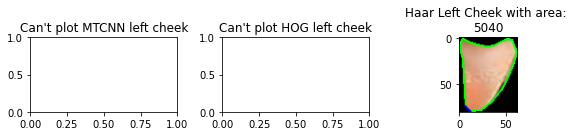

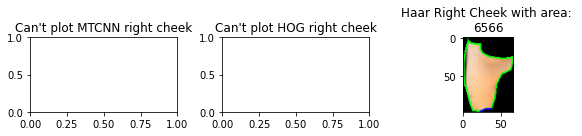

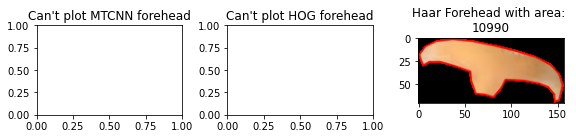

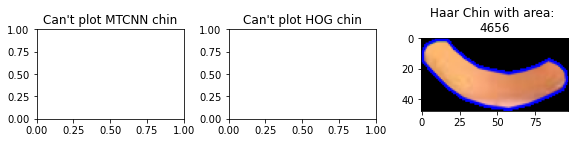

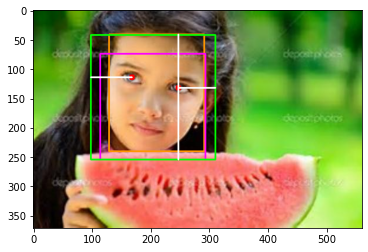

Image #15: 8_1_4_20170103200403187.jpg
MTCNN height is 523
MTCNN width is 422
MTCNN coordinate: width = 95to517
MTCNN coordinate: height = 114to637
HOG height is 446
HOG width is 446
HOG coordinate: width = 88to534
HOG coordinate: height = 187to633
Haar height is 466
Haar width is 466
Haar coordinate: width = 86to552
Haar coordinate: height = 136to602

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 210.0
Distance of right eye to right side of head (MTCNN with blue text): 140.5
Distance of left eye to left side of head (MTCNN with blue text): 91.0
Distance of left eye to bottom of head (MTCNN with blue text): 313.0

Distance of left eye to top of head (HOG with yellow text):137.0
Distance of right eye to right side of head (HOG with yellow text): 147.5
Distance of left eye to left side of head (HOG with yellow text): 108.0
Distance of left eye to bottom of head (HOG with yellow text): 309.0

Distance of left eye to top of head (Haar 

/Users/lalida/anaconda3/envs/test/lib/python3.7/site-packages/ipykernel_launcher.py:578: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


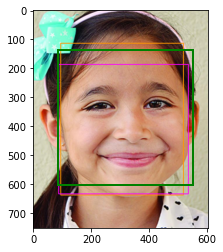

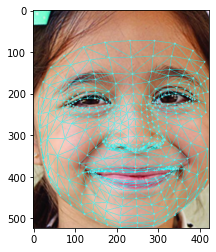

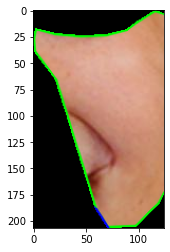

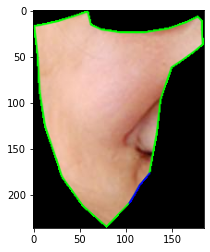

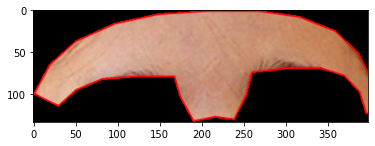

...

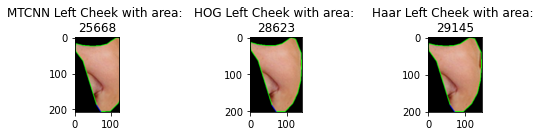

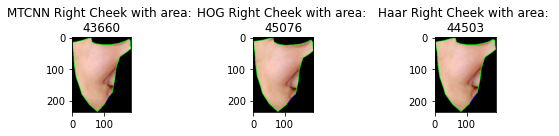

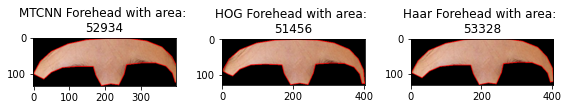

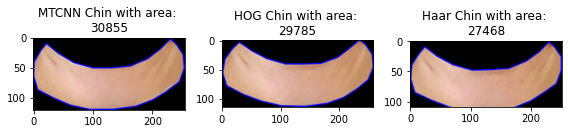

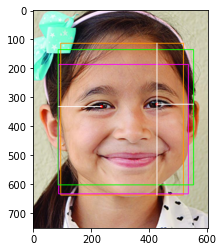

Image #16: 8_1_4_20170103212955884.jpg
MTCNN height is 99
MTCNN width is 80
MTCNN coordinate: width = 126to206
MTCNN coordinate: height = 59to158
HOG height is 86
HOG width is 87
HOG coordinate: width = 121to208
HOG coordinate: height = 74to160
Haar height is 125
Haar width is 125
Haar coordinate: width = 106to231
Haar coordinate: height = 52to177

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 39.5
Distance of right eye to right side of head (MTCNN with blue text): 23.5
Distance of left eye to left side of head (MTCNN with blue text): 21.0
Distance of left eye to bottom of head (MTCNN with blue text): 59.5

Distance of left eye to top of head (HOG with yellow text):24.5
Distance of right eye to right side of head (HOG with yellow text): 28.5
Distance of left eye to left side of head (HOG with yellow text): 23.0
Distance of left eye to bottom of head (HOG with yellow text): 61.5

Distance of left eye to top of head (Haar with pink t

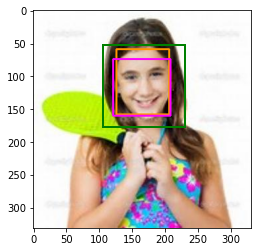

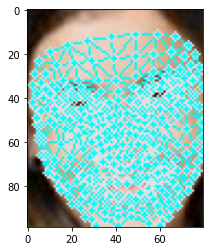

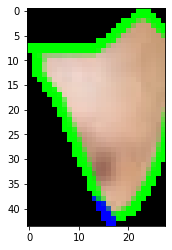

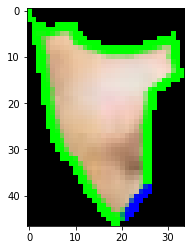

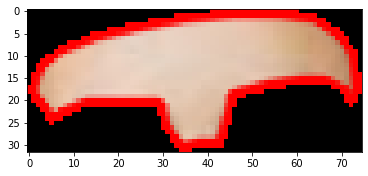

...

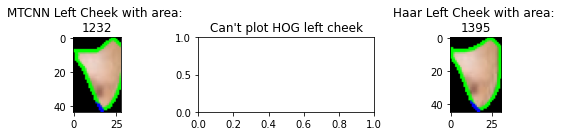

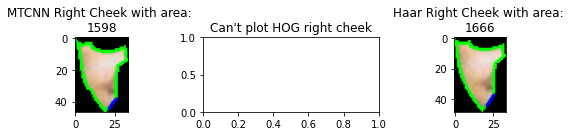

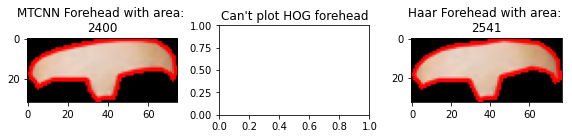

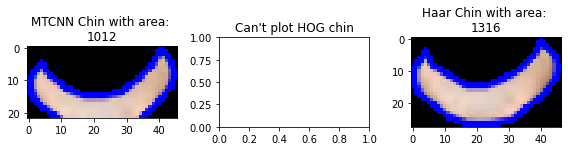

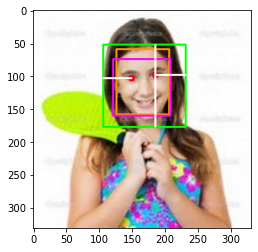

Image #17: 8_1_4_20170103233220163.jpg
MTCNN height is 133
MTCNN width is 111
MTCNN coordinate: width = 85to196
MTCNN coordinate: height = 82to215
HOG height is 103
HOG width is 104
HOG coordinate: width = 100to204
HOG coordinate: height = 112to215
Haar height is 141
Haar width is 141
Haar coordinate: width = 79to220
Haar coordinate: height = 82to223

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 56.5
Distance of right eye to right side of head (MTCNN with blue text): 37.5
Distance of left eye to left side of head (MTCNN with blue text): 22.0
Distance of left eye to bottom of head (MTCNN with blue text): 76.5

Distance of left eye to top of head (HOG with yellow text):26.5
Distance of right eye to right side of head (HOG with yellow text): 22.5
Distance of left eye to left side of head (HOG with yellow text): 30.0
Distance of left eye to bottom of head (HOG with yellow text): 76.5

Distance of left eye to top of head (Haar with pin

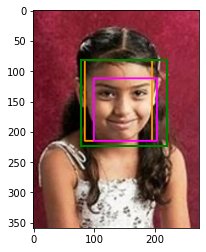

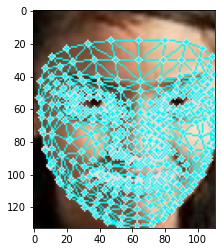

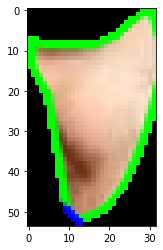

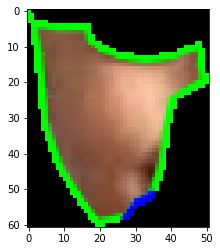

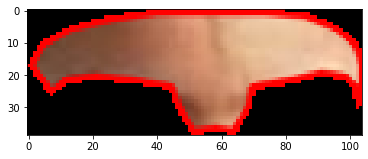

...

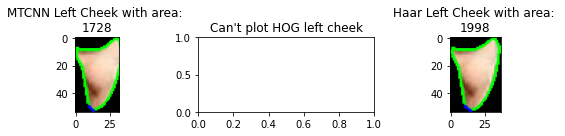

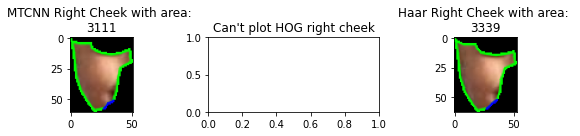

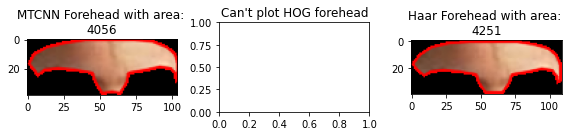

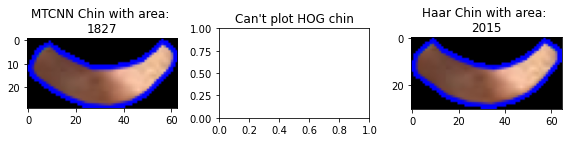

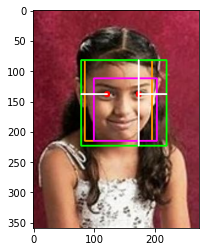

Image #18: 8_1_4_20170109201844552.jpg
MTCNN height is 208
MTCNN width is 170
MTCNN coordinate: width = 166to336
MTCNN coordinate: height = 182to390
HOG height is 149
HOG width is 149
HOG coordinate: width = 178to327
HOG coordinate: height = 228to377
Haar height is 215
Haar width is 215
Haar coordinate: width = 146to361
Haar coordinate: height = 177to392

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 76.0
Distance of right eye to right side of head (MTCNN with blue text): 48.0
Distance of left eye to left side of head (MTCNN with blue text): 44.0
Distance of left eye to bottom of head (MTCNN with blue text): 132.0

Distance of left eye to top of head (HOG with yellow text):30.0
Distance of right eye to right side of head (HOG with yellow text): 36.0
Distance of left eye to left side of head (HOG with yellow text): 35.0
Distance of left eye to bottom of head (HOG with yellow text): 119.0

Distance of left eye to top of head (Haar wi

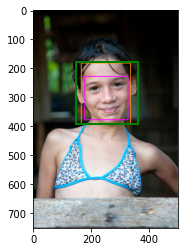

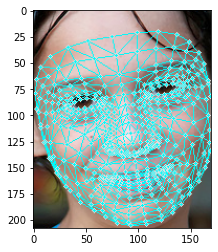

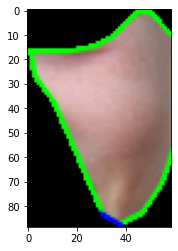

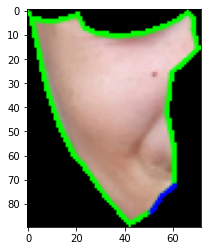

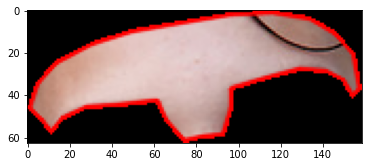

...

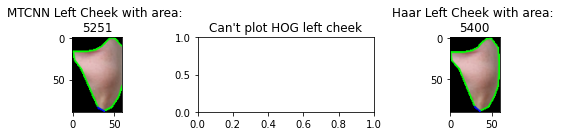

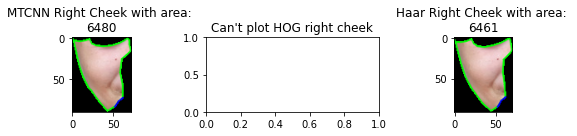

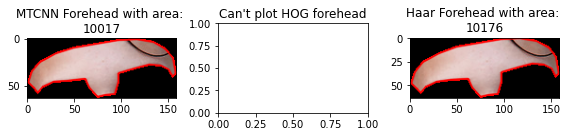

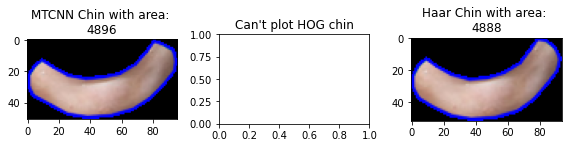

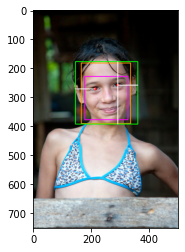

Image #19: 8_1_4_20161223232240516.jpg
MTCNN height is 179
MTCNN width is 142
MTCNN coordinate: width = 77to219
MTCNN coordinate: height = 63to242
HOG height is 149
HOG width is 150
HOG coordinate: width = 78to228
HOG coordinate: height = 95to244
Haar height is 187
Haar width is 187
Haar coordinate: width = 63to250
Haar coordinate: height = 66to253

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 76.0
Distance of right eye to right side of head (MTCNN with blue text): 46.0
Distance of left eye to left side of head (MTCNN with blue text): 26.5
Distance of left eye to bottom of head (MTCNN with blue text): 103.0

Distance of left eye to top of head (HOG with yellow text):44.0
Distance of right eye to right side of head (HOG with yellow text): 45.0
Distance of left eye to left side of head (HOG with yellow text): 35.5
Distance of left eye to bottom of head (HOG with yellow text): 105.0

Distance of left eye to top of head (Haar with pin

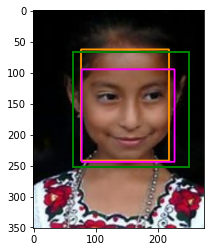

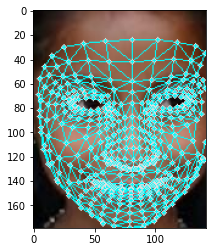

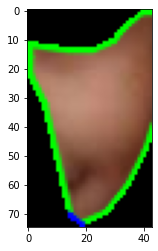

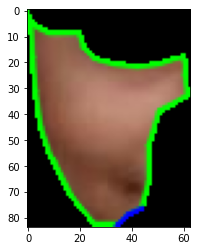

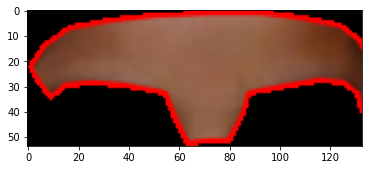

...

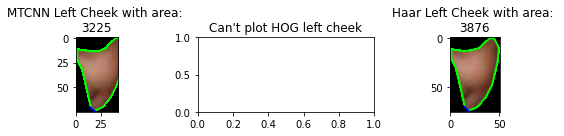

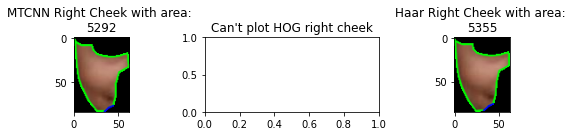

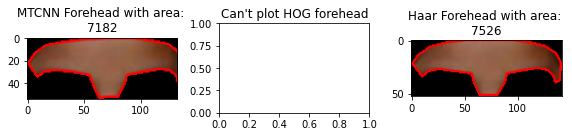

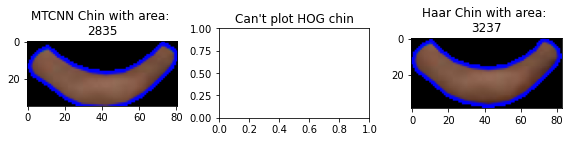

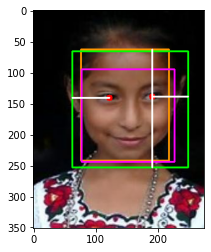

Image #20: 8_1_4_20170109202746183.jpg
MTCNN height is 134
MTCNN width is 108
MTCNN coordinate: width = 224to332
MTCNN coordinate: height = 93to227
HOG height is 124
HOG width is 124
HOG coordinate: width = 231to355
HOG coordinate: height = 107to231
Haar height is 147
Haar width is 147
Haar coordinate: width = 220to367
Haar coordinate: height = 81to228

Calculating eye distance with 3 methods

Distance of left eye to top of head (MTCNN with blue text): 47.5
Distance of right eye to right side of head (MTCNN with blue text): 40.0
Distance of left eye to left side of head (MTCNN with blue text): 12.5
Distance of left eye to bottom of head (MTCNN with blue text): 86.5

Distance of left eye to top of head (HOG with yellow text):33.5
Distance of right eye to right side of head (HOG with yellow text): 33.0
Distance of left eye to left side of head (HOG with yellow text): 35.5
Distance of left eye to bottom of head (HOG with yellow text): 90.5

Distance of left eye to top of head (Haar with p

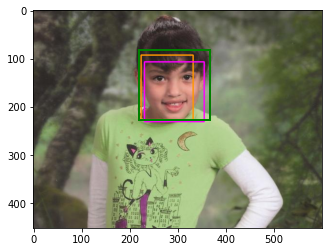

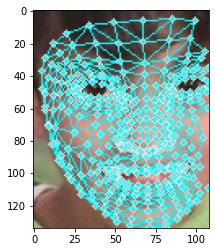

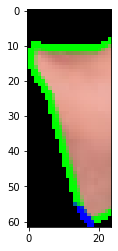

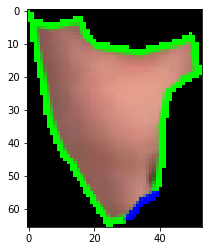

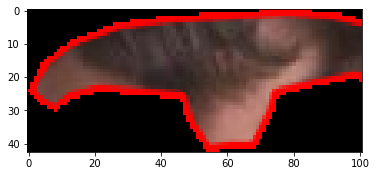

...

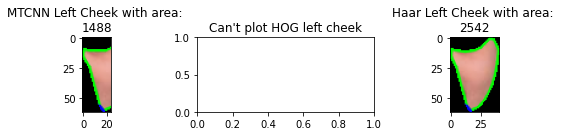

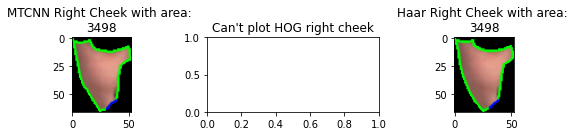

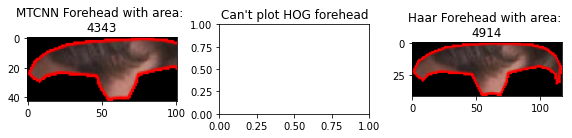

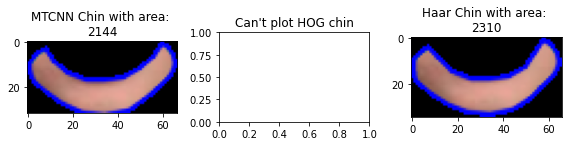

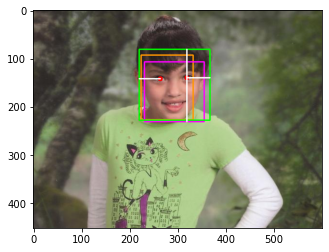

In [22]:
i = 1
for filename in glob.glob('./Frames/tmp/*.jpg'):
    name = str(filename).rstrip(".tiff").split('/')[-1] 
    print("Image #" + str(i) + ": " + str(name))
    i+=1
    img = cv2.imread(filename)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    clone = img.copy()
    clone_m = img.copy()
    clone_ho = img.copy()
    clone_ha = img.copy()
   
    
    m = mtcnn(img,rgb)
    ho = hog(img,rgb)
    ha = haar(img,rgb)
    
   
    
        
    

    
    
    height = np.size(img, 0)
    width = np.size(img, 1)
#     print('Frame height' + str(height))
#     print('Frame width' + str(width))

    

    
    if m is not None and ho is not None and ha is not None:
 

#         print('MTCNN Face Detected (Orange)')

        eye_detect = eye(img, rgb)
        
        
        
         
        
        if eye_detect is not None: 
            

            print('\nCalculating eye distance with 3 methods')
            
            #Check if left eye and right eye can be detected
            if eye_detect[2] and eye_detect[5] is not None:

                #calcuting eye distance with MTCNN
                D_top_m = top_head(rgb, m, eye_detect[0], eye_detect[1])
                print("\nDistance of left eye to top of head (MTCNN with blue text): " + str(D_top_m))
                
                D_right_m = right_head(rgb,m, eye_detect[3], eye_detect[4])
                print("Distance of right eye to right side of head (MTCNN with blue text): " + str(D_right_m))

                D_left_m = left_head(rgb,m, eye_detect[0], eye_detect[1])
                print("Distance of left eye to left side of head (MTCNN with blue text): " + str(D_left_m))


                D_bot_m = bot_head(rgb,m, eye_detect[0], eye_detect[1]) 
                print("Distance of left eye to bottom of head (MTCNN with blue text): " + str(D_bot_m))
                
                


#                 (mX, mY) = midpoint((eye_detect[0], m[1]), (eye_detect[0], eye_detect[1]))
#                 cv2.putText(rgb, "{:.1f} in".format((float(D_top_m))), (int(mX), int(0.5 * (m[1] + m[1] + m[3]))),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (0,180,255), 2)
#                 cv2.putText(rgb, "Eye to bottom: {:.1f}in".format((float(D_bot_m))), (int(mX), int(mY - 20)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (0,180,255), 2)
#                 cv2.putText(rgb, "Left eye to left: {:.1f}in".format((float(D_left_m))), (int(mX), int(mY - 30)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (0,180,255), 2)
#                 cv2.putText(rgb, "Right eye to right: {:.1f}in".format((float(D_right_m))), (int(mX), int(mY - 40)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (0,180,255), 2)




                #Calculating eye distance with HOG
                D_top_ho = top_head(rgb, ho, eye_detect[0], eye_detect[1])
                print("\nDistance of left eye to top of head (HOG with yellow text):" + str(D_top_ho))
                
                D_right_ho = right_head(rgb,ho,eye_detect[3], eye_detect[4]) 
                print("Distance of right eye to right side of head (HOG with yellow text): " + str(D_right_ho))


                D_left_ho = left_head(rgb,ho,eye_detect[0], eye_detect[1])
                print("Distance of left eye to left side of head (HOG with yellow text): " + str(D_left_ho))


                D_bot_ho = bot_head(rgb,ho,eye_detect[0], eye_detect[1]) 
                print("Distance of left eye to bottom of head (HOG with yellow text): " + str(D_bot_ho))
                
               


#                 (mX, mY) = midpoint((eye_detect[0], ho[1]), (eye_detect[0], eye_detect[1]))
#                 cv2.putText(rgb, "{:.1f} in".format(D_top_ho), (int(0.5*(ho[0] + ho[2])), int(ho[1]+ho[3])),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0), 2)
#                 cv2.putText(rgb, "Eye to bottom: {:.1f}in".format(D_bot_ho), (int(ho[0] - ho[2]), int(mY)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0), 2)
#                 cv2.putText(rgb, "Left eye to left: {:.1f}in".format(D_left_ho), (int(ho[0] - ho[2]), int(mY - 10)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0), 2)
#                 cv2.putText(rgb, "Right eye to right: {:.1f}in".format(D_right_ho), (int(ho[0] - ho[2]), int(mY - 20)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,0), 2)
                
                
                #Calculating eye distance with haar
                D_top_ha = top_head(rgb, ha,eye_detect[0], eye_detect[1])
                print("\nDistance of left eye to top of head (Haar with pink text): " + str(D_top_ha))
                
                
                D_right_ha = right_head(rgb,ha,eye_detect[3], eye_detect[4]) 
                print("Distance of right eye to right side of head (Haar with pink text): " + str(D_right_ha))


                D_left_ha = left_head(rgb,ha,eye_detect[0], eye_detect[1])
                print("Distance of left eye to left side of head (Haar with pink text): " + str(D_left_ha))


                D_bot_ha = bot_head(rgb,ha,eye_detect[0], eye_detect[1]) 
                print("Distance of left eye to bottom of head (Haar with pink text): " + str(D_bot_ha))
                
               

#                 (mX, mY) = midpoint((eye_detect[0], ha[1]), (eye_detect[0], eye_detect[1]))
#                 cv2.putText(rgb, "{:.1f} in".format(D_top_ha), (int(ha[0]), int(ha[1] + 10)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (254,39,132), 2)  #pink text
#                 cv2.putText(rgb, "Eye to bottom: {:.1f}in".format(D_bot_ha), (int(ha[0]), int(ha[1])),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (254,39,132), 2)  #pink text
#                 cv2.putText(rgb, "Left eye to left: {:.1f}in".format(D_left_ha), (int(ha[0]), int(ha[1] - 10)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (254,39,132), 2)  #pink text
#                 cv2.putText(rgb, "Right eye to right: {:.1f}in".format(D_right_ha), (int(ha[0]), int(ha[1] - 20)),
#                 cv2.FONT_HERSHEY_SIMPLEX, 2, (254,39,132), 2)  #pink text

            
            else:
                print("Can't detect eyes")
                D_top_m = 0
                De_right_m = 0
                D_bot_m = 0
                D_left_m = 0
                
                
                D_top_ho = 0
                D_right_ho = 0
                D_left_ho = 0
                D_bot_ho = 0
                
                D_top_ha = 0
                D_right_ha = 0
                D_left_ha = 0
                D_bot_ha = 0
                
                
                          
            best = []
            value = []

            #compare top (trying to find best distance with face not cut)
            if(D_top_m > D_top_ho) and D_top_m > D_top_ha:
                ref_top_m = D_top_m - D_top_m
                ref_top_ho = D_top_ho - D_top_m
                ref_top_ha = D_top_ha - D_top_m
                ref_top = m[1]
                ref_top_name = "MTCNN"

                
                
                print("\n ---MTCNN is the highest and is the reference point: " + str(D_top_m) + "---")
                print("Distance to top of HOG wrt MTCNN = " + str(ref_top_ho))
                print("Distance to top of Haar wrt MTCNN = " + str(ref_top_ha))
            elif D_top_ho > D_top_ha and D_top_ho > D_top_m:
                ref_top_m = D_top_m - D_top_ho
                ref_top_ho = D_top_ho - D_top_ho
                ref_top_ha = D_top_ha - D_top_ho
                ref_top = ho[1]
                ref_top_name = "HOG"
                
                
                print("\n --HOG is the highest and is the reference point: " + str(D_top_ho) + "---")
                print("Distance to top of MTCNN wrt HOG = " + str(ref_top_m))
                print("Distance to top of Haar wrt HOG = " + str(ref_top_ha))
                
            elif D_top_ha > D_top_ho and D_top_ha > D_top_m:
                ref_top_m = D_top_m - D_top_ha
                ref_top_ho = D_top_ho - D_top_ha
                ref_top_ha = D_top_ha - D_top_ha
                ref_top = ha[1]
                ref_top_name = "Haar"
                
                print("\n --Haar is the highest and is the reference point: " + str(D_top_ha) + "---")
                print("Distance to top of MTCNN wrt Haar = " + str(ref_top_m))
                print("Distance to top of HOG wrt Haar = " + str(ref_top_ho))
                
            elif D_top_ha == D_top_m:
                ref_top_m = D_top_m - D_top_m
                ref_top_ho = D_top_ho - D_top_m
                ref_top_ha = D_top_ha - D_top_m
                
                print("\n --Haar and MTCNN is the highest and is the reference point: " + str(D_top_ha) + "---")
                print("Distance to top of HOG wrt Haar and MTCNN= " + str(ref_top_ho))
                
            elif D_top_ho == D_top_m:
                ref_top_m = D_top_m - D_top_m
                ref_top_ho = D_top_ho - D_top_m
                ref_top_ha = D_top_ha - D_top_m
                
                print("\n --HOG and MTCNN is the highest and is the reference point: " + str(D_top_ho) + "---")
                print("Distance to top of Haar wrt HOG and MTCNN= " + str(ref_top_ho))
                
            else:
                ref_top_m = D_top_m - D_top_ha
                ref_top_ho = D_top_ho - D_top_ha
                ref_top_ha = D_top_ha - D_top_ha
                
                print("\n --Haar and HOG is the highest and is the reference point: " + str(D_top_ha) + "---")
                print("Distance to top of MTCNN wrt Haar and HOG= " + str(ref_top_ho))
                
                

           

            #compare right
            if D_right_m == 0 and D_right_ho == 0 and D_right_ha == 0:
                print("No right eye detected")
                best.append(0)
                value.append(0)
                
            elif(D_right_m > D_right_ho) and D_right_m > D_right_ha:
                ref_right_m = D_right_m - D_right_m
                ref_right_ho = D_right_ho - D_right_m
                ref_right_ha = D_right_ha - D_right_m
                ref_right = m[0]
                ref_right_name = "MTCNN"
            
                
                print("\n ---MTCNN is the most right and is the reference point: " + str(D_right_m) + "---")
                print("Distance to right of HOG wrt MTCNN = " + str(ref_right_ho))
                print("Distance to right of Haar wrt MTCNN = " + str(ref_right_ha))
                
                
            elif D_right_ho > D_right_ha and D_right_ho > D_right_m:
                ref_right_m = D_right_m - D_right_ho
                ref_right_ho = D_right_ho - D_right_ho
                ref_right_ha = D_right_ha - D_right_ho
                ref_right = ho[0]
                ref_right_name = "HOG"
            
                
                print("\n ---HOG is the most right and is the reference point: " + str(D_right_ho) + "---")
                print("Distance to right of MTCNN wrt HOG = " + str(ref_right_m))
                print("Distance to right of Haar wrt HOG = " + str(ref_right_ha))
            elif D_right_ha > D_right_ho and D_right_ha > D_right_m:
                ref_right_m = D_right_m - D_right_ha
                ref_right_ho = D_right_ho - D_right_ha
                ref_right_ha = D_right_ha - D_right_ha
                ref_right = ha[0]
                ref_right_name = "Haar"
            
                
                print("\n ---Haar is the most right and is the reference point: " + str(D_right_ha) + "---")
                print("Distance to right of HOG wrt Haar = " + str(ref_right_ho))
                print("Distance to right of MTCNN wrt Haar = " + str(ref_right_m))
                
            elif D_right_ha == D_right_m:
                ref_right_m = D_right_m - D_right_m
                ref_right_ho = D_right_ho - D_right_m
                ref_right_ha = D_right_ha - D_right_m
                
                print("\n --Haar and MTCNN is the most right and is the reference point: " + str(D_right_ha) + "---")
                print("Distance to right of HOG wrt Haar and MTCNN= " + str(ref_right_ho))
                
            elif D_right_ho == D_right_m:
                ref_right_m = D_right_m - D_right_m
                ref_right_ho = D_right_ho - D_right_m
                ref_right_ha = D_right_ha - D_right_m
                
                print("\n --HOG and MTCNN is the most right and is the reference point: " + str(D_right_ho) + "---")
                print("Distance to the right of Haar wrt HOG and MTCNN= " + str(ref_right_ho))
                
            else:
                ref_right_m = D_right_m - D_right_ha
                ref_right_ho = D_right_ho - D_right_ha
                ref_right_ha = D_right_ha - D_right_ha
                
                print("\n --Haar and HOG is the most right and is the reference point: " + str(D_right_ha) + "---")
                print("Distance to the right of MTCNN wrt Haar and HOG= " + str(ref_right_ho))
                


            #compare left
            if D_left_m == 0 and D_left_ho == 0 and D_left_ha == 0:
                print("No left eye detected")
                best.append(0)
                value.append(0)
            
            elif(D_left_m > D_left_ho) and D_left_m > D_left_ha:
                ref_left_m = D_left_m - D_left_m
                ref_left_ho = D_left_ho - D_left_m
                ref_left_ha = D_left_ha - D_left_m
                ref_left = m[0] + m[2]
                ref_left_name = "MTCNN"
                
                print("\n ---MTCNN is the most left and is the reference point: " + str(D_left_m) + "---")
                print("Distance to left of HOG wrt MTCNN = " + str(ref_left_ho))
                print("Distance to left of Haar wrt MTCNN = " + str(ref_left_ha))
                
            elif D_left_ho > D_left_ha and D_left_ho > D_left_m:
                ref_left_m = D_left_m - D_left_ho
                ref_left_ho = D_left_ho - D_left_ho
                ref_left_ha = D_left_ha - D_left_ho
                ref_left = ho[0] + ho[2]
                ref_left_name = "HOG"
                
                print("\n ---HOG is the most left and is the reference point: " + str(D_left_ho) + "---")
                print("Distance to left of MTCNN wrt HOG = " + str(ref_left_m))
                print("Distance to left of Haar wrt HOG = " + str(ref_left_ha))
            elif D_left_ha > D_left_ho and D_left_ha > D_left_m:
                ref_left_m = D_left_m - D_left_ha
                ref_left_ho = D_left_ho - D_left_ha
                ref_left_ha = D_left_ha - D_left_ha
                ref_left = ha[0] + ha[2]
                ref_left_name = "Haar"
            
                
                print("\n ---Haar is the most left and is the reference point: " + str(D_left_ha) + "---")
                print("Distance to leftt of HOG wrt Haar = " + str(ref_left_ho))
                print("Distance to left of MTCNN wrt Haar = " + str(ref_left_m))
                
            elif D_left_ha == D_left_m:
                ref_left_m = D_left_m - D_left_m
                ref_left_ho = D_left_ho - D_left_m
                ref_left_ha = D_left_ha - D_left_m
                
                print("\n --Haar and MTCNN is the most left and is the reference point: " + str(D_left_ha) + "---")
                print("Distance to left of HOG wrt Haar and MTCNN= " + str(ref_left_ho))
                
            elif D_left_ho == D_left_m:
                ref_left_m = D_left_m - D_left_m
                ref_left_ho = D_left_ho - D_left_m
                ref_left_ha = D_left_ha - D_left_m
                
                print("\n --HOG and MTCNN is the most left and is the reference point: " + str(D_left_ho) + "---")
                print("Distance to the left of Haar wrt HOG and MTCNN= " + str(ref_left_ho))
                
            else:
                ref_left_m = D_left_m - D_left_ha
                ref_left_ho = D_left_ho - D_left_ha
                ref_left_ha = D_left_ha - D_left_ha
                
                print("\n --Haar and HOG is the most left and is the reference point: " + str(D_left_ha) + "---")
                print("Distance to the left of MTCNN wrt Haar and HOG= " + str(ref_left_ho))
                




            #compare bottom
            if(D_bot_m > D_bot_ho) and D_bot_m > D_bot_ha:
                ref_bot_m = D_bot_m - D_bot_m
                ref_bot_ho = D_bot_ho - D_bot_m
                ref_bot_ha = D_bot_ha - D_bot_m
                ref_bot = m[1] + m[3]
                ref_bot_name = "MTCNN"
                
                print("\n --MTCNN is the lowest and is the reference point: " + str(D_bot_m) + "---")
                print("Distance to bottom of HOG wrt MTCNN = " + str(ref_bot_ho))
                print("Distance to bottom of Haar wrt MTCNN = " + str(ref_bot_ha))
            elif D_bot_ho > D_bot_ha and D_bot_ho > D_bot_m:
                ref_bot_m = D_bot_m - D_bot_ho
                ref_bot_ho = D_bot_ho - D_bot_ho
                ref_bot_ha = D_bot_ha - D_bot_ho
                ref_bot = ho[1] + ho[3]
                ref_bot_name = "HOG"
                
                print("\n --HOG is the lowest and is the reference point: " + str(D_bot_ho) + "---")
                print("Distance to bottom of MTCNN wrt HOG = " + str(ref_bot_m))
                print("Distance to bottom of Haar wrt HOG = " + str(ref_bot_ha))
            elif D_bot_ha > D_bot_ho and D_bot_ha > D_bot_m:
                ref_bot_m = D_bot_m - D_bot_ha
                ref_bot_ho = D_bot_ho - D_bot_ha
                ref_bot_ha = D_bot_ha - D_bot_ha
                ref_bot = ha[1] + ha[3]
                ref_bot_name = "Haar"
                
                print("\n --Haar is the lowest and is the reference point: " + str(D_top_ha) + "---")
                print("Distance to bottom of MTCNN wrt Haar = " + str(ref_bot_m))
                print("Distance to bottom of HOG wrt Haar = " + str(ref_bot_ho))
                
            elif D_bot_ha == D_bot_m:
                ref_bot_m = D_bot_m - D_bot_m
                ref_bot_ho = D_bot_ho - D_bot_m
                ref_bot_ha = D_bot_ha - D_bot_m
                
                print("\n --Haar and MTCNN is the most bottom and is the reference point: " + str(D_bot_ha) + "---")
                print("Distance to bottom of HOG wrt Haar and MTCNN= " + str(ref_bot_ho))
                
            elif D_bot_ho == D_bot_m:
                ref_bot_m = D_bot_m - D_bot_m
                ref_bot_ho = D_bot_ho - D_bot_m
                ref_bot_ha = D_bot_ha - D_bot_m
                
                print("\n --HOG and MTCNN is the most bottom and is the reference point: " + str(D_bot_ho) + "---")
                print("Distance to the bottom of Haar wrt HOG and MTCNN= " + str(ref_bot_ho))
                
            else:
                ref_bot_m = D_bot_m - D_bot_ha
                ref_bot_ho = D_bot_ho - D_bot_ha
                ref_bot_ha = D_bot_ha - D_bot_ha
                
                print("\n --Haar and HOG is the most bottom and is the reference point: " + str(D_bot_ha) + "---")
                print("Distance to the bottom of MTCNN wrt Haar and HOG= " + str(ref_bot_ho))
                
                
                
                
                
                
            ref_m = ref_top_m + ref_bot_m + ref_left_m + ref_right_m
            
            print("\nFinal comparison of MTCNN with other methods is: " + str(ref_m))
            
            ref_ho = ref_top_ho + ref_bot_ho + ref_left_ho + ref_right_ho
            print("Final comparison of HOG with other methods is: " + str(ref_ho))
            
            ref_ha = ref_top_ha + ref_bot_ha + ref_left_ha + ref_right_ha
            print("Final comparison of Haar with other methods is: " + str(ref_ha))
            
            
            
                
#             ref = []
#             v = []

#             print("The best detect is the combination of top = " + ref_top_name + ", bottom = " 
#                   + ref_bot_name + ", left = " + ref_left_name + ", right = " + ref_right_name)
#             roi_color = clone[ref_top : ref_bot, ref_right : ref_left]
#             print("Cropped face from optimal measurement")
#             feature_extraction = face_mesh(roi_color)
#             roi_color = cv2.cvtColor(roi_color, cv2.COLOR_BGR2RGB)
#             plt.figure()
#             plt.imshow(roi_color)


            #Print out best detector
            if ref_m > ref_ho and ref_m > ref_ha:
                print("\nThe best detector is MTCNN")
                
            elif ref_ho > ref_m and ref_ho > ref_ha:
                print("\nThe best detector is HOG")
            
            else: 
                print("\nThe best detector is Haar")
                
           
                    
            ###Feature Extraction from each bounding box###
          
            roi_color_m = clone_m[m[1] : m[1] + m[3], m[0] : m[0] + m[2]]
            print("\nCropped face from MTCNN")
            feature_extraction_m = face_mesh(roi_color_m)
            roi_color_m = cv2.cvtColor(roi_color_m, cv2.COLOR_BGR2RGB)
#             plt.figure()
#             plt.imshow(roi_color_m)

            roi_color_ho = clone_ho[ho[1] : ho[1] + ho[3], ho[0] : ho[0] + ho[2]]

#                 cv2.rectangle(clone_ho,(ho[0],ho[1]),(ho[0] + ho[2],ho[1]),(255,0,255),2)
            print("\nCropped face from HOG")
            feature_extraction_ho = face_mesh(roi_color_ho)
            roi_color_ho = cv2.cvtColor(roi_color_ho, cv2.COLOR_BGR2RGB)
#             plt.figure()
#             plt.imshow(roi_color_ho)

            roi_color_ha = clone_ha[ha[1] : ha[1] + ha[3] + 20, ha[0] : ha[0] + ha[2]]
#                 cv2.rectangle(clone_ha,(ha[0],ha[1]),(ha[0] + ha[2],ha[1]),(0,255,0),2)
            print("\nCropped face from Haar")
            feature_extraction_ha = face_mesh(roi_color_ha)
            roi_color_ha = cv2.cvtColor(roi_color_ha, cv2.COLOR_BGR2RGB)
#             plt.figure()
#             plt.imshow(roi_color_ha)
            
            
        
            #Printing out each feature (left cheek, right cheek, forehead, chin): 
#             row = feature, column = each method (4 x 3)
            fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))
            
            try:
                ax0.imshow(feature_extraction_m[0][0])
                ax0.set_title("MTCNN Left Cheek with area: \n%s" %feature_extraction_m[4])
#                 ax0.axis('off')
                
            except:
                ax0.set_title("Can't plot MTCNN left cheek")
                
            try:
                ax1.imshow(feature_extraction_ho[0][0])
                ax1.set_title("HOG Left Cheek with area: \n%s" %feature_extraction_ho[4])
#                 ax1.axis('off')
            except: 
                ax1.set_title("Can't plot HOG left cheek")
                
            try:
                ax2.imshow(feature_extraction_ha[0][0])
                ax2.set_title("Haar Left Cheek with area: \n%s" %feature_extraction_ha[4])
#                 ax2.axis('off')
                
            except:
                ax2.set_title("Can't plot Haar left cheek")

            fig.tight_layout()
            
            
             
            fig, (ax3, ax4, ax5) = plt.subplots(ncols=3, figsize=(8, 2))

            try:
                ax3.imshow(feature_extraction_m[1][0])
                ax3.set_title("MTCNN Right Cheek with area: \n%s" %feature_extraction_m[5])
#                 ax3.axis('off')
                
            except:
                ax3.set_title("Can't plot MTCNN right cheek")
                    
            try:

                ax4.imshow(feature_extraction_ho[1][0])
                ax4.set_title("HOG Right Cheek with area: \n%s" %feature_extraction_ho[5])
#                 ax4.axis('off')
            except:
                ax4.set_title("Can't plot HOG right cheek")
                
            try:
                ax5.imshow(feature_extraction_ha[1][0])
                ax5.set_title("Haar Right Cheek with area: \n%s" %feature_extraction_ha[5])
#                 ax5.axis('off')
            except:
                ax5.set_title("Can't plot Haar right cheek")
            fig.tight_layout()
            
            
             
            fig, (ax6, ax7, ax8) = plt.subplots(ncols=3, figsize=(8, 2))
            
            try:
                
                ax6.imshow(feature_extraction_m[2][0])
                ax6.set_title("MTCNN Forehead with area: \n%s" %feature_extraction_m[6])
#                 ax6.axis('off')
            except:
                ax6.set_title("Can't plot MTCNN forehead")
                
            try:
                
                ax7.imshow(feature_extraction_ho[2][0])
                ax7.set_title("HOG Forehead with area: \n%s" %feature_extraction_ho[6])
#                 ax7.axis('off')
            except:
                ax7.set_title("Can't plot HOG forehead")
                
            try:
                ax8.imshow(feature_extraction_ha[2][0])
                ax8.set_title("Haar Forehead with area: \n%s" %feature_extraction_ha[6])
#                 ax8.axis('off')
                
            except:
                ax8.set_title("Can't plot Haar forehead")

            fig.tight_layout()
            
            
             
            fig, (ax9, ax10, ax11) = plt.subplots(ncols=3, figsize=(8, 2))
            try:
                
                ax9.imshow(feature_extraction_m[3][0])
                ax9.set_title("MTCNN Chin with area: \n%s" %feature_extraction_m[7])
#                 ax9.axis('off')
            except:
                ax9.set_title("Can't plot MTCNN chin")
            try:
                
                ax10.imshow(feature_extraction_ho[3][0])
                ax10.set_title("HOG Chin with area: \n%s" %feature_extraction_ho[7])
#                 ax10.axis('off')
                
            except:
                ax10.set_title("Can't plot HOG chin")
                
            try:
                
                ax11.imshow(feature_extraction_ha[3][0])
                ax11.set_title("Haar Chin with area: \n%s" %feature_extraction_ha[7])
#                 ax11.axis('off')
                
            except:
                ax11.set_title("Can't plot Haar chin")

            fig.tight_layout()
            
               
            plt.figure()
            plt.imshow(rgb)
            

            
            

        else:
            print("Failed Eye Detection")
            
       


    else: 
        print("No 3 face detection")
        
    pyplot.imshow(rgb)
    pyplot.show()  
    print("======================")
    
    
    

MTCNN height is 255
MTCNN width is 205
MTCNN coordinate: width = 252to457
MTCNN coordinate: height = 115to370
HOG height is 215
HOG width is 215
HOG coordinate: width = 257to472
HOG coordinate: height = 161to376
Haar height is 239
Haar width is 239
Haar coordinate: width = 239to478
Haar coordinate: height = 125to364


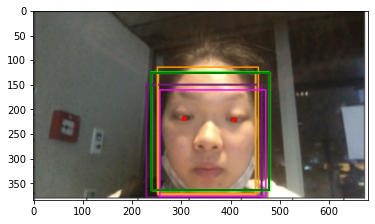

In [14]:
for filename in glob.glob('./Images/Detected/Hospital_Night/Screen Shot 2565-01-30 at 01.33.46.png'):
    img = cv2.imread(filename)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    m = mtcnn(img,rgb)
    ho = hog(img,rgb)
    ha = haar(img,rgb)
    
    eye_detect = eye(img, rgb)
    
    pyplot.imshow(rgb)
    pyplot.show()